 <span style="font-size:19pt;">Name: Lamine Deen</span>

 <span style="font-size:16pt;">1. a)</span>

 <span style="font-size:16pt;">1. b)</span>

In [1]:
import pandas as pd
import numpy as np

# read csv file 
filepath = "AirQualityUCI.csv"
df = pd.read_csv(filepath, delimiter=';')

#display number of rows and columns
print("Number of rows and columns: \n")
print(df.shape)

# remove completely empty rows
df = df.dropna(how='all')

print("Number of rows and columns: \n")
print(df.shape)

#remove completly empty columns
df = df.dropna(axis=1, how='all')

print("Numbers of rows and columns: \n")
print(df.shape)

# find occurences of -200 in columns and remove column if more than 10% instances
occurrences = df.apply(lambda col: (col == -200).sum())

# find percentages for each columns
percentage = occurrences / len(df) * 100

# Filter columns with more than 10% of occurrences of -200
columns_to_drop = percentage[percentage > 10].index

# Display the result
print("Occurrences of -200 in each column:")
print(occurrences)

print("\nPercentage of occurrences of -200 in each column:")
print(percentage)

print("\nColumns with more than 10% of occurrences of -200:")
print(columns_to_drop)

# Drop the bad columns 
df = df.drop(columns=columns_to_drop)

# Display the cleaned DataFrame
print("\nDataFrame after removing columns with more than 10% of occurrences of -200:")
print(df.shape)
print(df.head(15))

# replace commas with period for all columns except Date and Time

for column in df.select_dtypes(include=['object']).columns:
    if column not in ["Date", "Time"]:
      df[column] = df[column].str.replace(",", ".")

print("After changing commmas to periods")
print(df.head(10))


# Convert all numeric columns to double except "Date" and "Time"
for column in df.columns:
    if column not in ["Date", "Time"]:
        df[column] = pd.to_numeric(df[column], errors='coerce').astype(float)

# replace period with colon
df["Time"] = df["Time"].str.replace(".", ":")

# Display the modified DataFrame
print(df.head(10))

Number of rows and columns: 

(9471, 17)
Number of rows and columns: 

(9357, 17)
Numbers of rows and columns: 

(9357, 15)
Occurrences of -200 in each column:
Date                0
Time                0
CO(GT)              0
PT08.S1(CO)       366
NMHC(GT)         8443
C6H6(GT)            0
PT08.S2(NMHC)     366
NOx(GT)          1639
PT08.S3(NOx)      366
NO2(GT)          1642
PT08.S4(NO2)      366
PT08.S5(O3)       366
T                   0
RH                  0
AH                  0
dtype: int64

Percentage of occurrences of -200 in each column:
Date              0.000000
Time              0.000000
CO(GT)            0.000000
PT08.S1(CO)       3.911510
NMHC(GT)         90.231912
C6H6(GT)          0.000000
PT08.S2(NMHC)     3.911510
NOx(GT)          17.516298
PT08.S3(NOx)      3.911510
NO2(GT)          17.548360
PT08.S4(NO2)      3.911510
PT08.S5(O3)       3.911510
T                 0.000000
RH                0.000000
AH                0.000000
dtype: float64

Columns with more than 10

In [2]:
# Combine 'Date' and 'Time' columns into a single datetime column
df['DateTime'] = pd.to_datetime(df['Date'] + ' ' + df['Time'], format='%d/%m/%Y %H:%M:%S')

# Drop the original 'Date' and 'Time' columns
df = df.drop(['Date', 'Time'], axis=1)

# print(df.head(10))

#sort entire dataframe by datetime for chronological order
df = df.sort_values(by= "DateTime")

# print(df.head(10))
print(df.shape)

# Create a new column 'Hour' to represent the hour of the day
df['Hour'] = df['DateTime'].dt.hour
# print(df.head(10))

# Pivot DataFrame for non-overlapping time-series for each day
pivoted_df = df.pivot(index='DateTime', columns='Hour')
# print(df.head(10))

# Seperate MultiIndex columns
pivoted_df.columns = [f'{hour}_{column}' for hour, column in pivoted_df.columns]
# print(df.head(10))

# Reset index to make DateTime a column
pivoted_df.reset_index(inplace=True)

# Function to convert hours to integers
def parse_hours_to_int(hour_str):
    try:
        return int(hour_str)
    except ValueError:
        return None  # Handle invalid values gracefully if needed

# Apply the function to create a new 'Hour' column
df['Hour'] = df['Hour'].apply(parse_hours_to_int)

print(df.head(20))

# Function to replace -200 with the mean of the column
def replace_minus_200_with_mean(column):
    column_mean = column[column != -200].mean()
    return column.replace(-200, column_mean)

# Apply the function to each column
df = df.apply(replace_minus_200_with_mean)

print(df.head(20))


(9357, 11)
    CO(GT)  PT08.S1(CO)  C6H6(GT)  PT08.S2(NMHC)  PT08.S3(NOx)  PT08.S4(NO2)  \
0      2.6       1360.0      11.9         1046.0        1056.0        1692.0   
1      2.0       1292.0       9.4          955.0        1174.0        1559.0   
2      2.2       1402.0       9.0          939.0        1140.0        1555.0   
3      2.2       1376.0       9.2          948.0        1092.0        1584.0   
4      1.6       1272.0       6.5          836.0        1205.0        1490.0   
5      1.2       1197.0       4.7          750.0        1337.0        1393.0   
6      1.2       1185.0       3.6          690.0        1462.0        1333.0   
7      1.0       1136.0       3.3          672.0        1453.0        1333.0   
8      0.9       1094.0       2.3          609.0        1579.0        1276.0   
9      0.6       1010.0       1.7          561.0        1705.0        1235.0   
10  -200.0       1011.0       1.3          527.0        1818.0        1197.0   
11     0.7       1066.0      

In [3]:
# Assuming df is your DataFrame
# Replace 'YourDateTimeColumnName' with the actual name of your DateTime column
datetime_column_name = 'DateTime'

# Get data types of all columns
column_dtypes = df.dtypes

# Identify columns that are not int or float
non_numeric_columns = [col for col, dtype in column_dtypes.items() if col != datetime_column_name and dtype not in ['int64', 'float64']]

if not non_numeric_columns:
    print("All columns are either int or float, excluding the DateTime column.")
else:
    print("Columns that are not int or float:", non_numeric_columns)

All columns are either int or float, excluding the DateTime column.


 <span style="font-size:16pt;">1. c)</span>

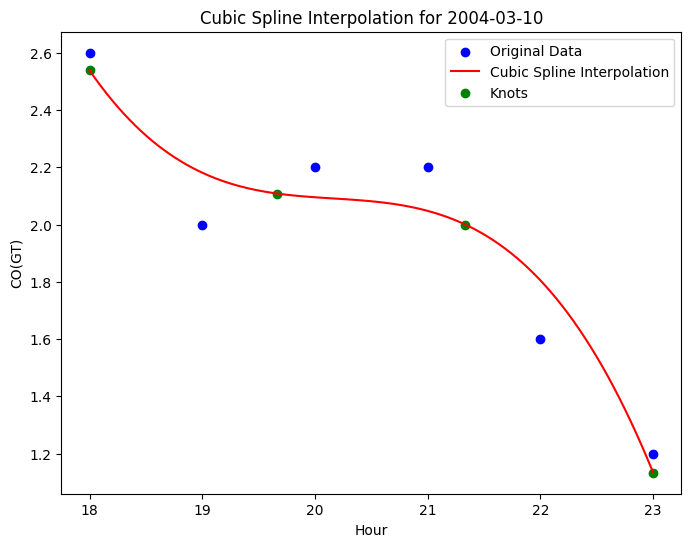

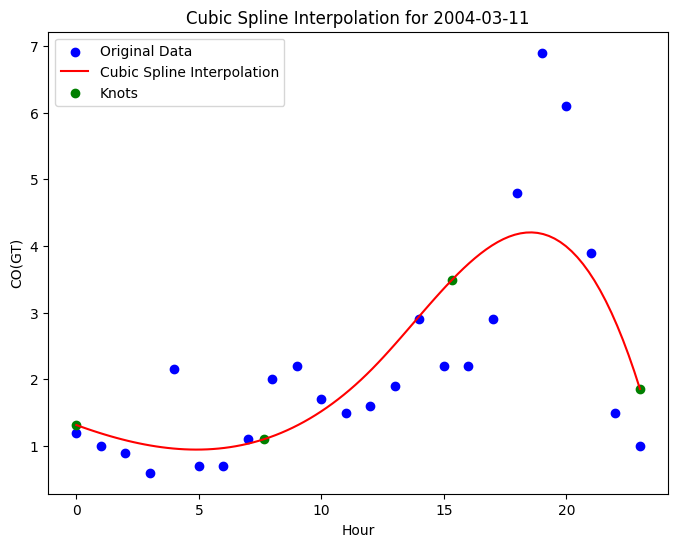

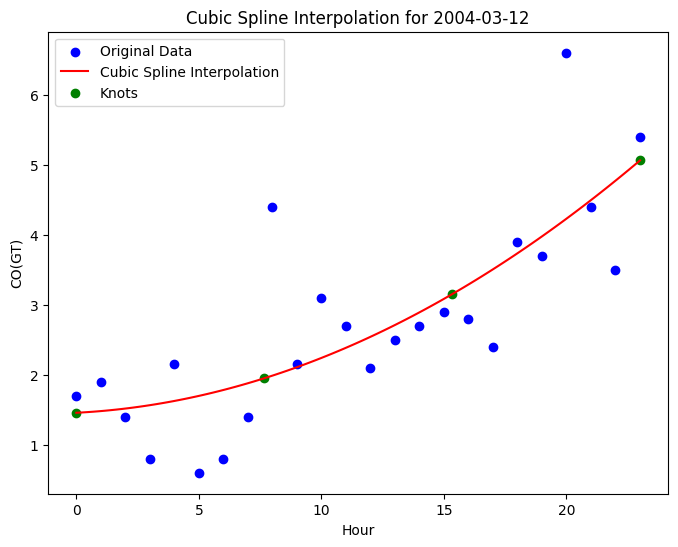

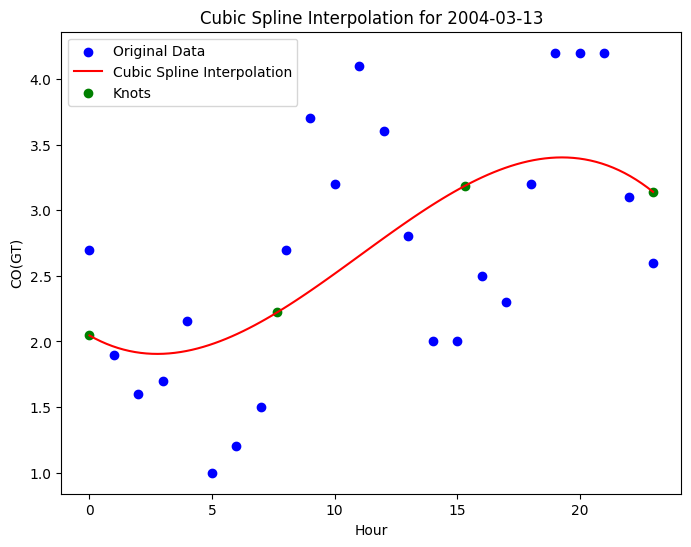

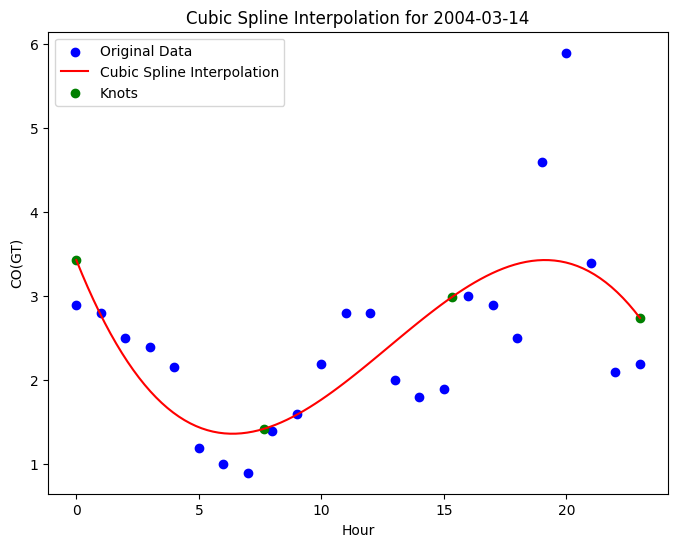

...

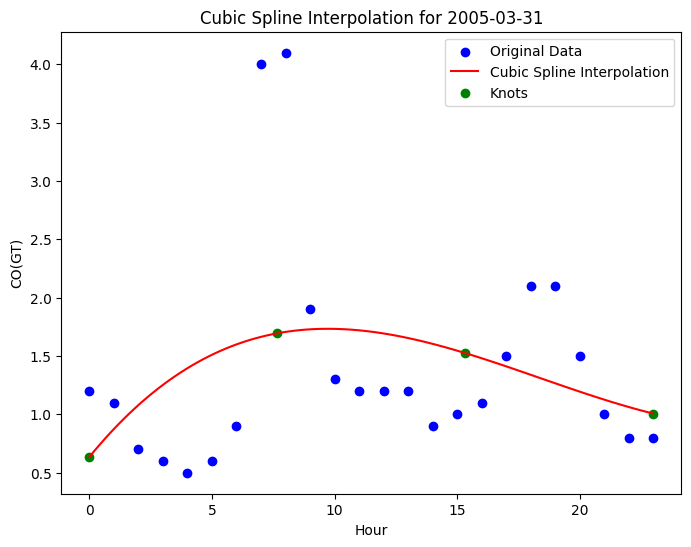

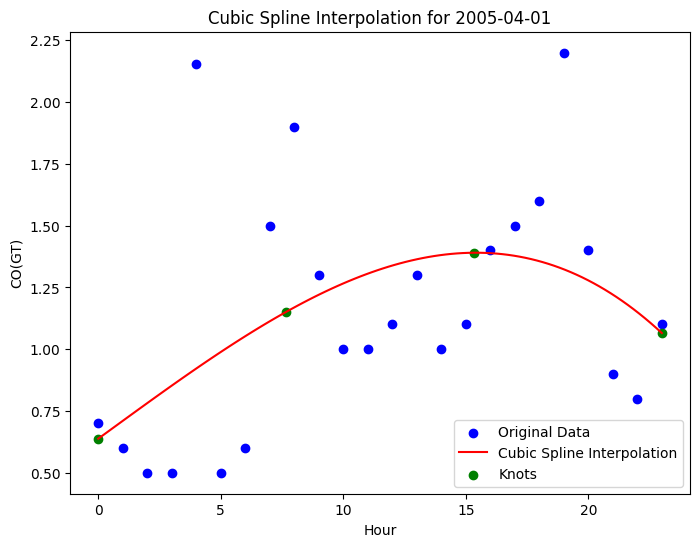

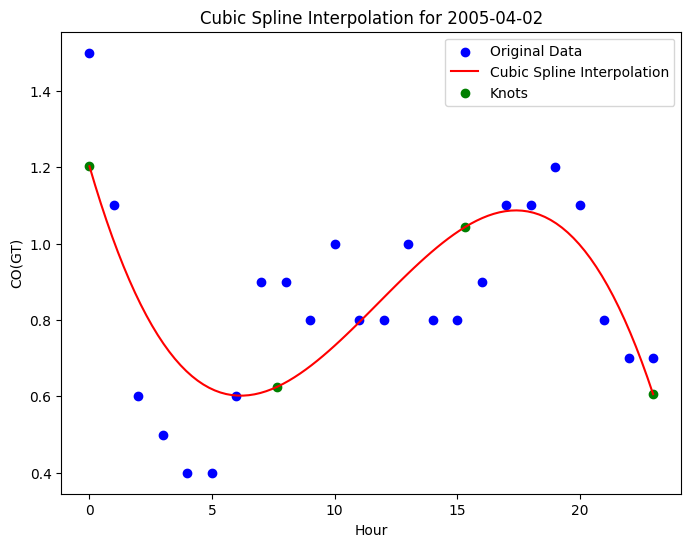

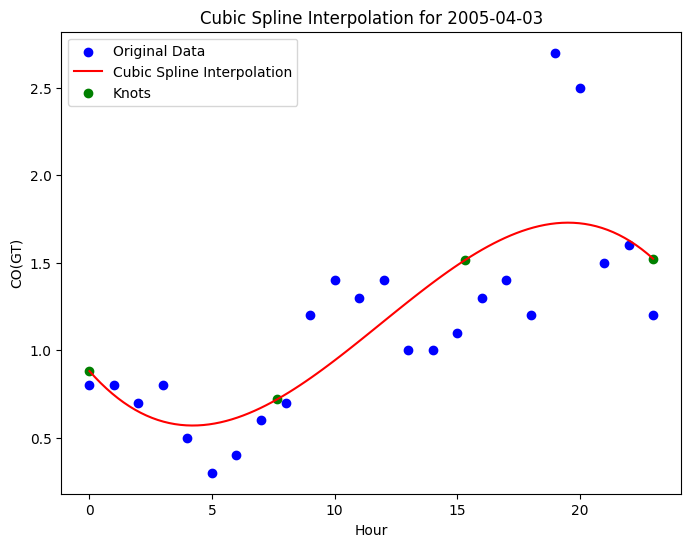

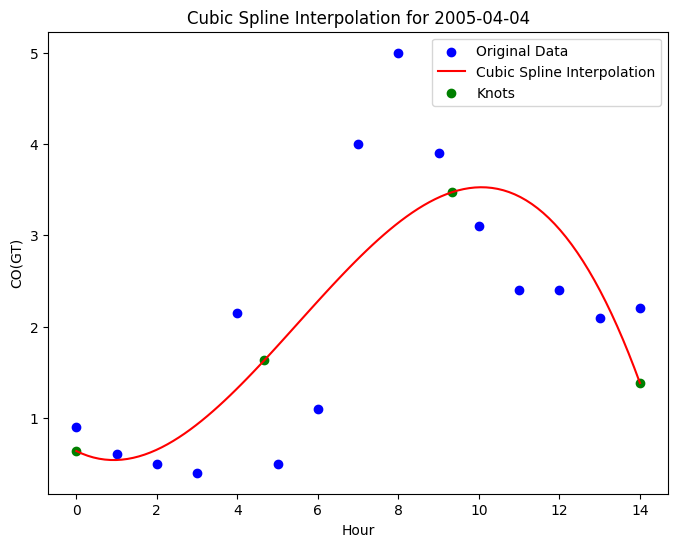

In [4]:
import matplotlib.pyplot as plt
from scipy.interpolate import UnivariateSpline

df['DateTime'] = pd.to_datetime(df['DateTime'])

# Get unique days from datetime column and perform cubic spline interpolation for each day
unique_days = df['DateTime'].dt.date.unique()

for day in unique_days:
    daily_data = df[df['DateTime'].dt.date == day]

    # Check if a day has less than 24 readings
    if len(daily_data) < 24:
        # If less than 24 readings, choose knots spaced evenly
        knots = np.linspace(min(daily_data['Hour']), max(daily_data['Hour']), 4)
    else:
        # If 24 or more readings, choose knots spaced evenly
        knots = np.linspace(min(daily_data['Hour']), max(daily_data['Hour']), 4)

    # Create a set of points for interpolation (excluding original data points)
    interpolation_points = np.linspace(min(daily_data['Hour']), max(daily_data['Hour']), 100)
    
    # Interpolate using UnivariateSpline with chosen knots
    spline = UnivariateSpline(daily_data['Hour'], daily_data['CO(GT)'], k=3, ext='zeros')
    interpolated_values = spline(interpolation_points)

    # Plot original and interpolated data
    plt.figure(figsize=(8, 6))
    plt.scatter(daily_data['Hour'], daily_data['CO(GT)'], label='Original Data', color='blue')
    plt.plot(interpolation_points, interpolated_values, label='Cubic Spline Interpolation', color='red')
    plt.scatter(knots, spline(knots), marker='o', color='green', label='Knots')
    plt.xlabel('Hour')
    plt.ylabel('CO(GT)')
    plt.title(f'Cubic Spline Interpolation for {day}')
    plt.legend()
    plt.show()
